In [6]:
# Base ------------------------------------------------
import numpy as np
import pandas as pd
import scipy.stats as ss
import statsmodels.stats.weightstats as smw
import math
import plotly.express as px

pd.options.display.max_columns = None
pd.options.display.max_rows = None
pd.options.display.float_format = '{:.1f}'.format

#plt.style.use('seaborn')
# Viz -------------------------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('ggplot')
%matplotlib inline
import plotly.express as px

# Standard Library Imports
from pathlib import Path

from plotnine import *

from geopy.geocoders import Nominatim
from geopy.exc import GeocoderTimedOut

from plotnine import *
plt.style.use('ggplot')

In [7]:
intrum = pd.read_parquet('IE_Intrum_working.parquet')

In [8]:
# Load Market data
Italy_df = pd.read_excel('worldcities.xlsx', sheet_name='Italy2')

In [9]:
intrum.drop_duplicates(keep='first', inplace=True)

In [10]:
# Drop pictures and description per client suggestion
intrum = intrum.drop(columns=['main_photo_url', 'description'])

In [11]:
#Geographical range = Italy
# create a boolean mask based on latitude and longitude range for Italy
italy_lat_range = (35.5, 47.1)
italy_lon_range = (6.6, 18.5)
mask = (intrum['latitude'].between(*italy_lat_range)) & (intrum['longitude'].between(*italy_lon_range))
intrum = intrum[mask]

In [12]:
# Select only the regions from the Geo file
regions = Italy_df[['admin_name','latmin', 'latmax', 'logmin', 'logmax']]
regions = regions.drop_duplicates()

In [13]:
# *Create Regional column*
# Iterate over the coordinates in your original DataFrame
for index, row in intrum.iterrows():
    lat = row['latitude']
    lon = row['longitude']

    # Find the region that matches the coordinate range
    matching_region = regions[
        (regions['latmin'] <= lat) &
        (regions['latmax'] >= lat) &
        (regions['logmin'] <= lon) &
        (regions['logmax'] >= lon)
    ]['admin_name']
    
   # Check if matching_region has any elements
    if not matching_region.empty:
        # Get the first element of matching_region as a string
        matching_region = matching_region.iloc[0]
    else:
        matching_region = 'Unknown'  # or any other desired value when no match is found
        
    # Assign the region to a new column in your original DataFrame
    intrum.at[index, 'Region'] = matching_region

# Normalize Surface

In [14]:
# Split of Surface from surface including commercial
intrum.loc[:, 'surface_res'] = intrum.surface.str.split(pat='m²', expand=True)[0]

In [15]:
intrum['surface_res']= intrum['surface_res'].str.strip()

In [16]:
# Replace commerciale with none
intrum.loc[intrum['surface_res'].str.contains('commerciale'), 'surface_res'] = None

In [17]:
intrum['surface_res'] = intrum['surface_res'].str.replace('.', "", regex=False)

In [18]:
intrum = intrum.astype({'surface_res':'float'})

In [19]:
# Normalize Commercial surface
intrum.loc[:, 'surface_comm'] = intrum.surface.str.split(pat='commerciale', expand=True)[1]

intrum['surface_comm']= intrum['surface_comm'].str.replace(' m²',"")

#Remove . from numbers 
for index, row in intrum.iterrows():
    if row["surface_comm"] is not None and "." in row["surface_comm"]:
        intrum.at[index, "surface_comm"] = row["surface_comm"].replace(".", "")

#Replace , with .  from numbers for US notation
for index, row in intrum.iterrows():
    if row["surface_comm"] is not None and "," in row["surface_comm"]:
        intrum.at[index, "surface_comm"] = row["surface_comm"].replace(",", ".")

intrum = intrum.astype({'surface_comm':'float'})

Normalize price, surface, Latitude, longitud exclude 0 or negatives

In [20]:
intrum = intrum[(intrum['price'] > 0) & intrum['price'].notna()]
intrum = intrum[(intrum['surface_res'] > 0) & intrum['surface_res'].notna()]
intrum = intrum[(intrum['latitude'] > 0) & intrum['latitude'].notna()]
intrum = intrum[(intrum['longitude'] > 0) & intrum['longitude'].notna()]

In [21]:
intrum['price_per_m2'] = intrum.apply(lambda x: x['price'] / x['surface_res'] if x['surface_res'] else 0, axis=1)

 **Based on these calculations, we adjust the dataset with the highest upperlimit for price per m^2 (<7,822) and surface (<1,000)**

In [22]:
intrum = intrum[(intrum['price_per_m2'] > 0.99) & (intrum['price_per_m2'] <= 7822)]
intrum = intrum[(intrum['surface_res'] > 0.99) & (intrum['surface_res'] <= 1000)]

The tallest building in the world has 163 floors (Burj Khalifa in Dubai)

The tallest building in Italy has 31 (UniCredit Tower in Milan)
Considering the tallest building in Italy

In [23]:
intrum = intrum[(intrum['total_building_floors'] >= 0) & (intrum['total_building_floors'] <= 10)]

In [24]:
#Replace NaNs with median values
intrum['construction_year'] = intrum.groupby('Region')['construction_year'].transform(lambda x: x.fillna(x.median()))

In [25]:
# Replace Construction year > 2023 with median
const_yr = [2024, 2025, 2033, 2089, 2100, 7080, 9999]
for i in const_yr:
    intrum.loc[intrum['construction_year']==i, 'construction_year'] = intrum.groupby('Region')['construction_year'].transform(lambda x: x.replace(i, x.median()))

# Energy

In [26]:
intrum['energy_efficiency'].describe()

count     149250
unique      2739
top            G
freq       74807
Name: energy_efficiency, dtype: object

In [27]:
na_count = intrum['energy_efficiency'].isna().sum()
print(na_count)

45774


In [28]:
comma_counts = intrum['energy_efficiency'].str.count(',').sum()
print("Count of ',' :")
print(comma_counts)

Count of ',' :
401.0


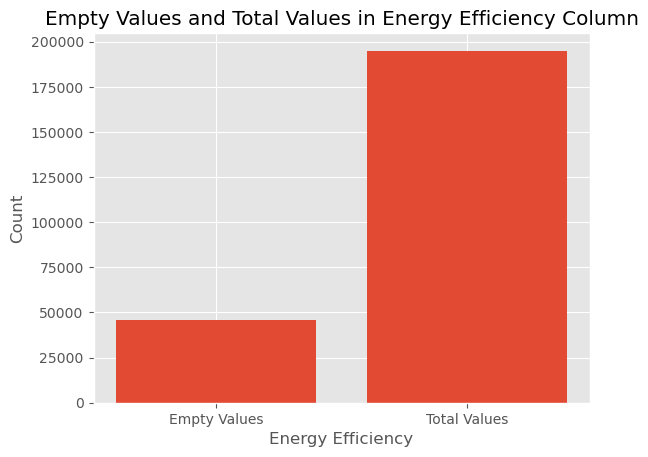

In [29]:
# Count the number of empty values in the "energy_efficiency" column
empty_counts = intrum['energy_efficiency'].isnull().sum()

# Calculate the total count of values in the "energy_efficiency" column
total_counts = len(intrum['energy_efficiency'])

# Create a bar plot
plt.bar(['Empty Values', 'Total Values'], [empty_counts, total_counts])

# Set the labels and title
plt.xlabel('Energy Efficiency')
plt.ylabel('Count')
plt.title('Empty Values and Total Values in Energy Efficiency Column')

# Show the plot
plt.show()

From 2015 the new APE has replaced the former certificate (ACE), so that now each building is assigned a specific energy class. Current dataset includes values from previous classification and new one. The past rating system with 8 classes: A+ / A / B / C / D / E / F / G, is replaced by a new rating system based on 10 classes (A4 / A3 / A2 / A1 / B / C / D / E / F / G) https://www.certificato-energetico.it/articoli/prestazione-energetica.html

The purchase and sale of properties in the first three energy categories (A, B and C) grew by 6% and those of buildings undergoing renovation to improve their energy efficiency by 12%. It is a legal requirement in Italy to get Energy Certification (since August 2017 update) in order to: deed, exchange, sell or rent, donate, release new buildings, renovate over 25% of the building surface. https://www.certificato-energetico.it/en/epc.html https://www.certificato-energetico.it/certificazione-energetica.html https://www.idealista.it/en/news/property-sale-italy/2019/05/16/2476-future-energy-efficiency-home-italy

The values in the intrum['energy_efficiency'] column has a wide range of efficiencies within classes. Since the energy efficiency is not the main focus of analysis we will simplify them to a class value. This will help in creating a normalized and standardized representation of the data, making it easier to analyze and compare.

In [30]:
intrum['energy_efficiency'] = intrum['energy_efficiency'].str.replace(',', '')
intrum['energy_efficiency'] = intrum['energy_efficiency'].replace('', None)

In [31]:
comma_counts = intrum['energy_efficiency'].str.count(',').sum()
print("Count of ',' :")
print(comma_counts)
na_count = intrum['energy_efficiency'].isna().sum()
print(na_count)

Count of ',' :
0.0
46155


'A' rating contains sub categories,which in order to ran the analysis we'll merge into one.

In [32]:
# Calculate count of missing values (NaN) before replacing with 'TEMP'
nan_count = intrum['energy_efficiency'].isna().sum()
print(nan_count)

# Replace missing values with a temporary placeholder value
intrum['energy_efficiency'] = intrum['energy_efficiency'].fillna('M') # M = Missing value

intrum['energy_efficiency'] = intrum['energy_efficiency'].replace(['A+', 'A4≥', 'A+≥', 'A4≥'], 'A4')

intrum.loc[intrum['energy_efficiency'].str.contains('B'), 'energy_efficiency'] = 'B'
intrum.loc[intrum['energy_efficiency'].str.contains('C'), 'energy_efficiency'] = 'C'
intrum.loc[intrum['energy_efficiency'].str.contains('D'), 'energy_efficiency'] = 'D'
intrum.loc[intrum['energy_efficiency'].str.contains('E'), 'energy_efficiency'] = 'E'
intrum.loc[intrum['energy_efficiency'].str.contains('F'), 'energy_efficiency'] = 'F'
intrum.loc[intrum['energy_efficiency'].str.contains('G'), 'energy_efficiency'] = 'G'

intrum.loc[intrum['energy_efficiency'].str.contains('A'), 'energy_efficiency'] = 'A'

46155


In [33]:
temp_count = (intrum['energy_efficiency'] == 'M').sum()
print(temp_count)

46155


In [34]:
# M - for missing 
intrum.energy_efficiency.value_counts()

G    82627
M    46155
F    18371
A    17575
E    12387
D     8597
C     5002
B     4310
Name: energy_efficiency, dtype: int64

In [35]:
energy_count = intrum['energy_efficiency'].value_counts()
energy_percentages = round(energy_count / energy_count.sum() * 100, 2)

print(energy_percentages)

G   42.4
M   23.7
F    9.4
A    9.0
E    6.3
D    4.4
C    2.6
B    2.2
Name: energy_efficiency, dtype: float64


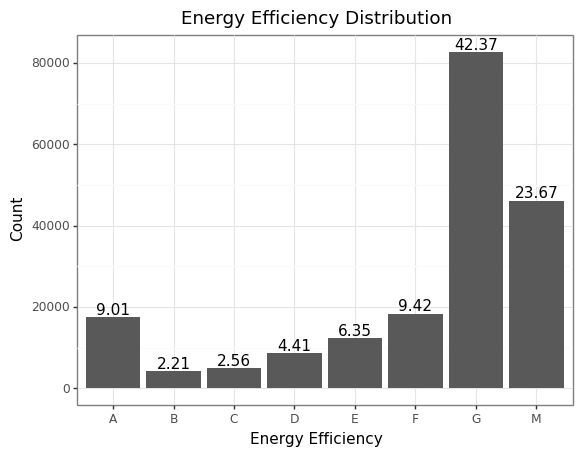

In [36]:
# Calculate the count and percentages
energy_count = intrum['energy_efficiency'].value_counts()
energy_percentages = round(energy_count / energy_count.sum() * 100, 2)

# Create a new DataFrame to store the count and percentages
data = pd.DataFrame({'Energy Efficiency': energy_count.index, 'Count': energy_count.values, 'Percentage': energy_percentages.values})

# Plot the bar chart with percentages
plot = (ggplot(data, aes(x='Energy Efficiency', y='Count')) +
        geom_bar(stat='identity', size=1.5) +
        geom_text(aes(label='Percentage'), position='identity', va='bottom') +  # Add text labels for percentages
        ggtitle('Energy Efficiency Distribution') +
        theme_bw() +
        theme(legend_position='none'))

# Display the plot
print(plot)

# M - for missing 

According to Reuters 60% of buildings in Italy are in the two worst energy classes. https://www.reuters.com/business/environment/italy-gets-cold-feet-over-eu-greener-buildings-plan-2023-02-03/

This alines with our data where property in classes F and G in total take 51.26% of listings.

In [37]:
ownership_counts = intrum['ownership'].value_counts()
ownership_percentages = round(ownership_counts / ownership_counts.sum() * 100, 2)

print(ownership_percentages)

Full ownership      98.7
Bare ownership       0.9
Surface right        0.2
Co-ownership         0.1
Partial ownership    0.1
Name: ownership, dtype: float64


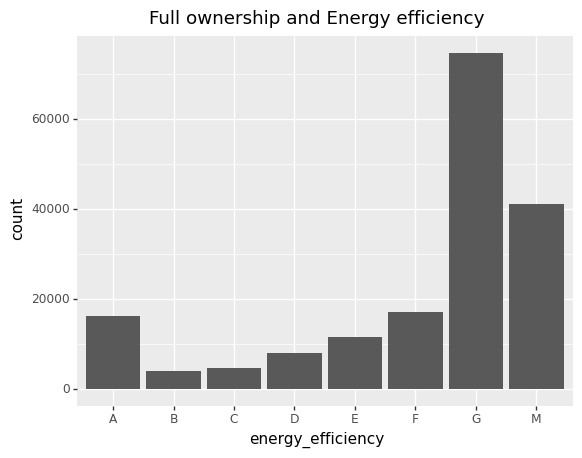

<ggplot: (115336847141)>

In [38]:
(ggplot(intrum[intrum['ownership'] == 'Full ownership'])
 +aes(x='energy_efficiency')
 +geom_bar(stat='count', size = 1.5)
 +ggtitle('Full ownership and Energy efficiency')
)

'A' represents the most efficient level and 'G' represents the least efficient level in dataset. We will assign numerical values in ascending order, where 'A' is assigned the highest numerical value (e.g., 7) and 'G' is assigned the lowest numerical value (e.g., 1).

Lets explore new correlations in order to understand better how to deal with NaN values

In [39]:
# Mapping of energy efficiency levels to numerical values
efficiency_mapping = {'A': 7, 'B': 6, 'C': 5, 'D': 4, 'E': 3, 'F': 2, 'G': 1, 'M': 0}

# Convert 'energy_efficiency' column to numerical values
intrum['energy_efficiency_num'] = intrum['energy_efficiency'].map(efficiency_mapping)

<AxesSubplot:xlabel='0', ylabel='0'>

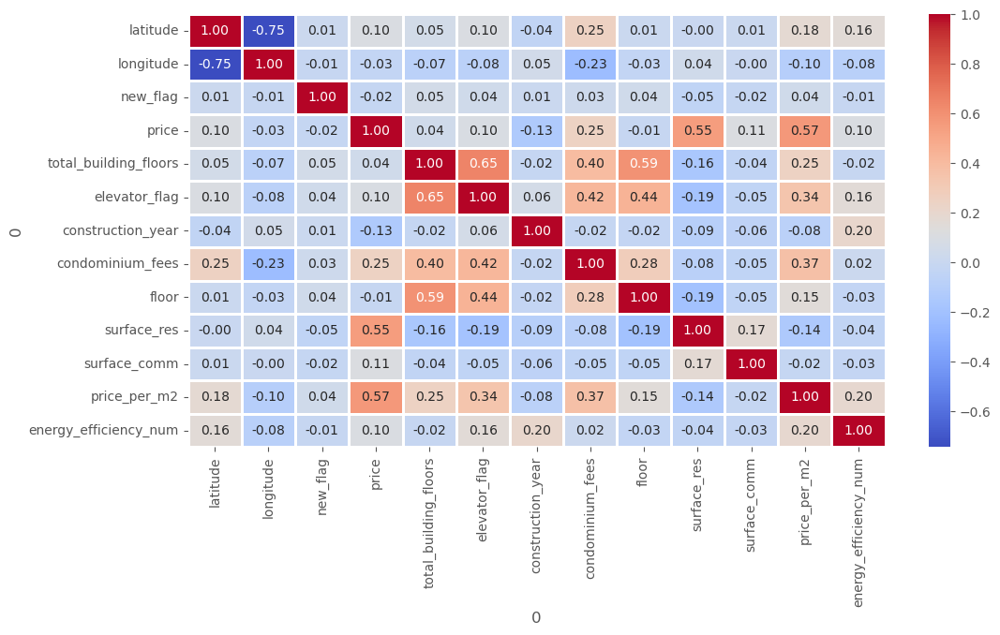

In [40]:
plt.figure(figsize=(12, 6))
sns.heatmap(intrum.corr(),
            cmap = 'coolwarm',
            fmt = '.2f',
            linewidths = 1,
            annot = True)

energy_efficiency_num shows some correlation with construction_year. So lets explore it and use this finding in order to fill Nan values.

In [41]:
# with missing values
region_most_common_missing = intrum.loc[intrum['energy_efficiency_num'] != 0].groupby('Region')['energy_efficiency_num'].apply(lambda x: x.mode().max())
print(region_most_common_missing)

Region
Abruzzo           1
Calabria          1
Campania          1
Emilia-Romagna    1
Lazio             1
Liguria           1
Lombardia         1
Piemonte          1
Puglia            1
Sardegna          1
Sicilia           1
Toscana           1
Veneto            7
Name: energy_efficiency_num, dtype: int64


In [42]:
region_most_common = intrum.loc[intrum['energy_efficiency_num'] != 0].groupby('Region')['energy_efficiency_num'].apply(lambda x: x.mode().max())
print(region_most_common)

Region
Abruzzo           1
Calabria          1
Campania          1
Emilia-Romagna    1
Lazio             1
Liguria           1
Lombardia         1
Piemonte          1
Puglia            1
Sardegna          1
Sicilia           1
Toscana           1
Veneto            7
Name: energy_efficiency_num, dtype: int64


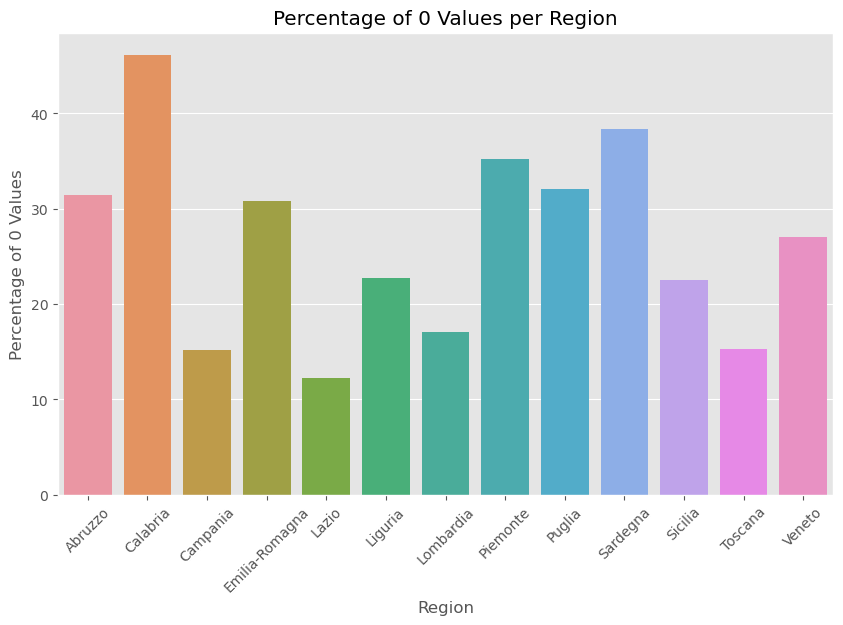

In [43]:
# Calculate percentage of missing values by region
percentage_0_by_region = (intrum['energy_efficiency_num'] == 0).groupby(intrum['Region']).mean() * 100

# Plot percentage of 'M' values by region
plt.figure(figsize=(10, 6))
sns.barplot(x=percentage_0_by_region.index, y=percentage_0_by_region.values)
plt.xlabel('Region')
plt.ylabel('Percentage of 0 Values')
plt.title('Percentage of 0 Values per Region')
plt.xticks(rotation=45)
plt.show()

In [44]:
nan_energy = intrum['energy_efficiency_num'][intrum['energy_efficiency_num'] == 0]  # Selecting only the NaN values

df = pd.DataFrame({'construction_year': intrum['construction_year'][intrum['energy_efficiency_num'] == 0], 
                   'nan_energy': nan_energy})

df.head(20)

,construction_year,nan_energy
0,1975.0,0
18,1985.0,0
19,1945.0,0
20,1975.0,0
25,2001.0,0
29,1968.0,0
30,1975.0,0
32,1990.0,0
34,1980.0,0
51,1975.0,0


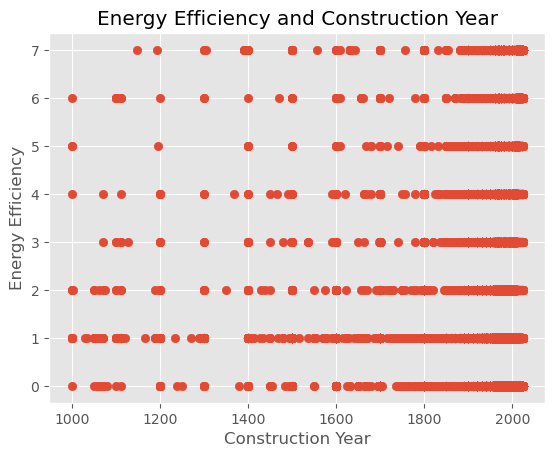

In [45]:
# Create a scatter plot
plt.scatter(intrum['construction_year'], intrum['energy_efficiency_num'])

# Add labels and title
plt.xlabel('Construction Year')
plt.ylabel('Energy Efficiency')
plt.title('Energy Efficiency and Construction Year')

# Display the plot
plt.show()

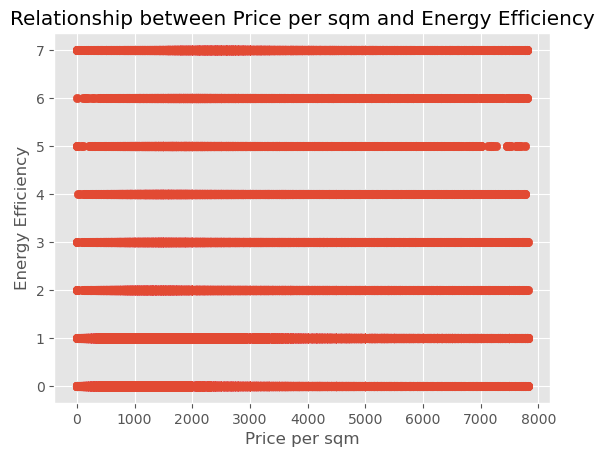

In [46]:
plt.scatter(intrum['price_per_m2'], intrum['energy_efficiency_num'])
plt.xlabel('Price per sqm')
plt.ylabel('Energy Efficiency')
plt.title('Relationship between Price per sqm and Energy Efficiency')
plt.show()

# Since energy_efficiency_num column is contains Discrete Variables, we will use mode in order to populate NaN values.

In [47]:
intrum.energy_efficiency_num.value_counts()

1    82627
0    46155
2    18371
7    17575
3    12387
4     8597
5     5002
6     4310
Name: energy_efficiency_num, dtype: int64

In [48]:
# Define a function to round the construction year to the nearest decade
def round_to_decade(year):
    return int(year // 10 * 10)

# Round the construction year to the nearest decade
intrum['construction_decade'] = intrum['construction_year'].apply(round_to_decade)

# Group by region, construction decade, and calculate the mean price
region_mean_price = intrum.groupby(['Region', 'construction_decade'])['price'].mean().reset_index()

# Group by region, construction decade, and mean price to find the most common energy efficiency level
region_most_common = intrum.loc[intrum['energy_efficiency_num'] != 0].groupby(['Region', 'construction_decade'])['energy_efficiency_num'].apply(lambda x: x.mode().max()).reset_index()

print(region_most_common)

             Region  construction_decade  energy_efficiency_num
0           Abruzzo                 1190                      1
1           Abruzzo                 1600                      2
2           Abruzzo                 1700                      1
3           Abruzzo                 1800                      1
4           Abruzzo                 1850                      4
5           Abruzzo                 1860                      1
6           Abruzzo                 1900                      1
7           Abruzzo                 1920                      1
8           Abruzzo                 1930                      1
9           Abruzzo                 1940                      1
10          Abruzzo                 1950                      1
11          Abruzzo                 1960                      1
12          Abruzzo                 1970                      1
13          Abruzzo                 1980                      1
14          Abruzzo                 1990

In [49]:
# Merge with mean price per region and construction decade
result = pd.merge(region_most_common, region_mean_price, on=['Region', 'construction_decade'])

print (result)

             Region  construction_decade  energy_efficiency_num     price
0           Abruzzo                 1190                      1  148000.0
1           Abruzzo                 1600                      2  247000.0
2           Abruzzo                 1700                      1  265000.0
3           Abruzzo                 1800                      1  214666.7
4           Abruzzo                 1850                      4  207000.0
5           Abruzzo                 1860                      1   40000.0
6           Abruzzo                 1900                      1  223083.3
7           Abruzzo                 1920                      1  197600.0
8           Abruzzo                 1930                      1  110500.0
9           Abruzzo                 1940                      1  140428.6
10          Abruzzo                 1950                      1  165605.5
11          Abruzzo                 1960                      1  160937.2
12          Abruzzo                 19

In [50]:
# Iterate over the result DataFrame and replace 0 values
for _, row in result.iterrows():
    region = row['Region']
    construction_decade = row['construction_decade']
    mean_price = row['price']
    common_efficiency = row['energy_efficiency_num']
    
    # Update the corresponding rows in the intrum DataFrame
    intrum.loc[(intrum['Region'] == region) & (intrum['construction_decade'] == construction_decade) & (intrum['price'] == mean_price) & (intrum['energy_efficiency_num'] == 0), 'energy_efficiency_num'] = common_efficiency

In [51]:
intrum.energy_efficiency_num.value_counts()

1    82628
0    46154
2    18371
7    17575
3    12387
4     8597
5     5002
6     4310
Name: energy_efficiency_num, dtype: int64

# Lets drop mean price as it doesnt hepl much in populating of the column

In [52]:
most_common_efficiency = intrum.groupby([intrum['construction_year'] // 10 * 10, intrum['Region']])['energy_efficiency_num'].apply(
    lambda x: x.mode().iloc[0] if not x.isna().all() else None)

# Printing the most common energy_efficiency_num value for each decade and region
print(most_common_efficiency)

construction_year  Region        
1000.0             Emilia-Romagna    2
                   Lazio             1
                   Lombardia         2
                   Piemonte          0
                   Toscana           1
                   Veneto            1
1030.0             Toscana           1
1050.0             Lazio             1
                   Puglia            2
                   Sicilia           1
                   Toscana           1
1060.0             Campania          1
                   Emilia-Romagna    0
                   Lazio             1
                   Liguria           1
                   Lombardia         1
                   Piemonte          0
1070.0             Lazio             2
                   Lombardia         0
                   Piemonte          1
                   Sicilia           0
                   Toscana           3
1080.0             Piemonte          0
1100.0             Lazio             0
                   Liguria    

In [53]:
intrum.loc[intrum['energy_efficiency_num'] == 0, 'energy_efficiency_num'] = intrum[intrum['energy_efficiency_num'] == 0].apply(
    lambda row: most_common_efficiency[(row['construction_year'] // 10 * 10, row['Region'])] if row['Region'] in most_common_efficiency.index.get_level_values(1) else row['energy_efficiency_num'],
    axis=1
)

# As we are left with more Nan values lets make the search for most common value more broad

In [54]:
# Calculate the most common energy efficiency level per region
region_most_common = intrum.loc[intrum['energy_efficiency_num'] != 0].groupby('Region')['energy_efficiency_num'].apply(lambda x: x.mode().max())

print(region_most_common)

Region
Abruzzo           1
Calabria          1
Campania          1
Emilia-Romagna    1
Lazio             1
Liguria           1
Lombardia         1
Piemonte          1
Puglia            1
Sardegna          1
Sicilia           1
Toscana           1
Veneto            7
Name: energy_efficiency_num, dtype: int64


In [55]:
# Assign overall most common energy efficiency per region to remaining 0 values excluding Venice
intrum['energy_efficiency_num'] = np.where((intrum['energy_efficiency_num'] == 0) & (intrum['Region'] != 'Venice'),
                                           intrum['Region'].map(region_most_common).fillna(region_most_common),
                                           intrum['energy_efficiency_num'])

In [56]:
intrum.energy_efficiency_num.value_counts()

1    123040
7     22146
2     18374
3     12387
4      9112
5      5003
6      4962
Name: energy_efficiency_num, dtype: int64

In [57]:
intrum.energy_efficiency_num.unique()

array([1, 3, 7, 6, 4, 2, 5], dtype=int64)

In [58]:
na_count = intrum[intrum['energy_efficiency_num'] == 0]
print(na_count)

Empty DataFrame
Columns: [latitude, longitude, heating, air_conditioning, surface, new_flag, status, caption, price, room, property_class, category, total_building_floors, bathroom, elevator_flag, construction_year, title, condominium_fees, ownership, other_features, energy_efficiency, floor_text, floor, typology, visibility, Region, surface_res, surface_comm, price_per_m2, energy_efficiency_num, construction_decade]
Index: []


In [59]:
na_count = intrum['energy_efficiency_num'].isna().sum()
print(na_count)

0


In [60]:
intrum['energy_efficiency_num'].describe()

count   195024.0
mean         2.3
std          2.1
min          1.0
25%          1.0
50%          1.0
75%          3.0
max          7.0
Name: energy_efficiency_num, dtype: float64

# Energy normalized. Visualization

Correlation updated

<AxesSubplot:xlabel='0', ylabel='0'>

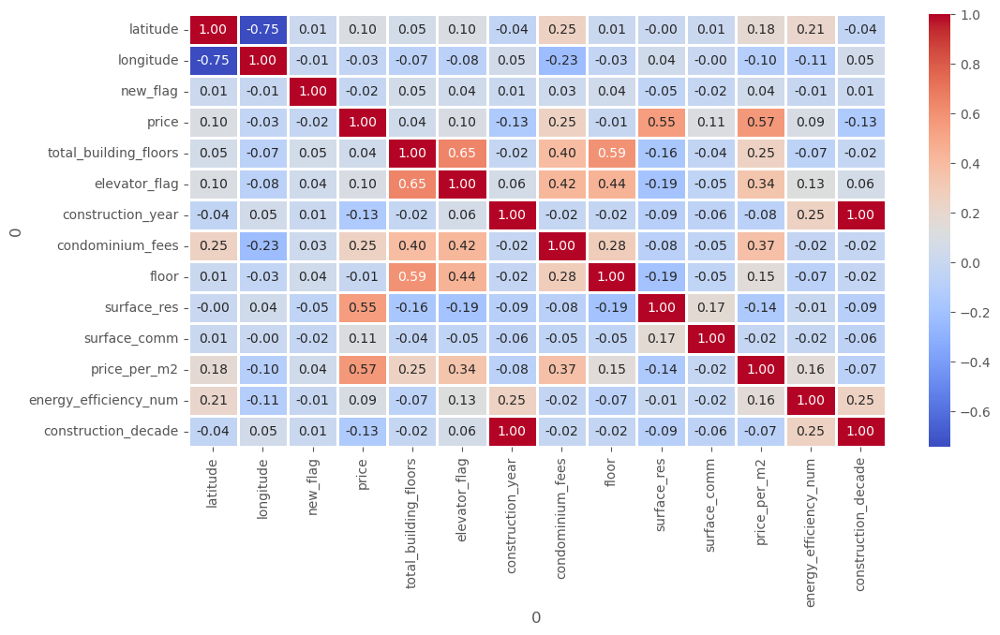

In [61]:
plt.figure(figsize=(12, 6))
sns.heatmap(intrum.corr(),
            cmap = 'coolwarm',
            fmt = '.2f',
            linewidths = 1,
            annot = True)

where A=7 - the best, and G = 1 - the worst

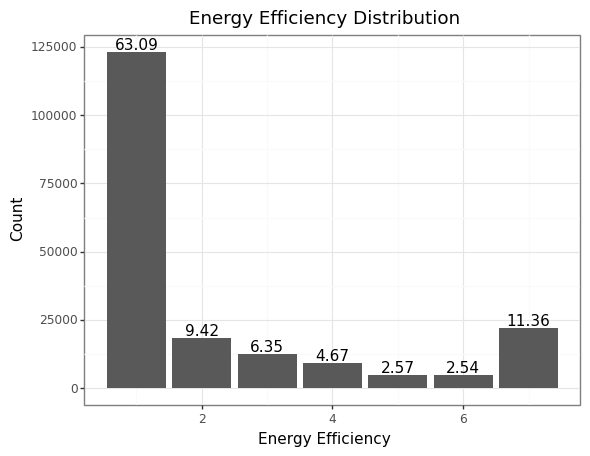

In [62]:
# Calculate the count and percentages
energy_count = intrum['energy_efficiency_num'].value_counts()
energy_percentages = round(energy_count / energy_count.sum() * 100, 2)

# Create a new DataFrame to store the count and percentages
data = pd.DataFrame({'Energy Efficiency': energy_count.index, 'Count': energy_count.values, 'Percentage': energy_percentages.values})

# Plot the bar chart with percentages
plot = (ggplot(data, aes(x='Energy Efficiency', y='Count')) +
        geom_bar(stat='identity', size=1.5) +
        geom_text(aes(label='Percentage'), position='identity', va='bottom') +  # Add text labels for percentages
        ggtitle('Energy Efficiency Distribution') +
        theme_bw() +
        theme(legend_position='none'))

# Display the plot
print(plot)

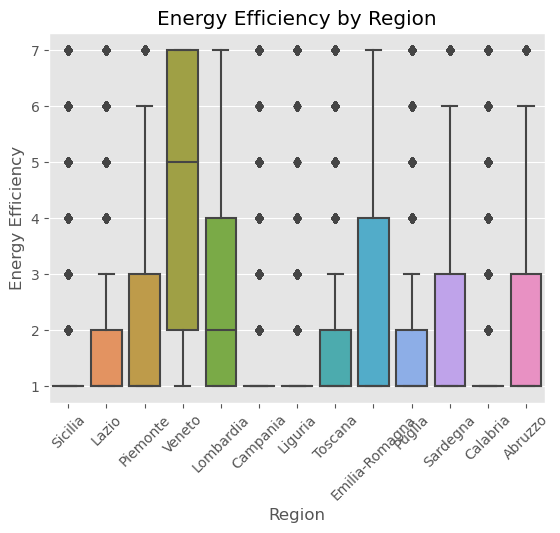

In [63]:
# Box plot
sns.boxplot(x='Region', y='energy_efficiency_num', data=intrum)
plt.xlabel('Region')
plt.ylabel('Energy Efficiency')
plt.title('Energy Efficiency by Region')
plt.xticks(rotation=45)  
plt.show()

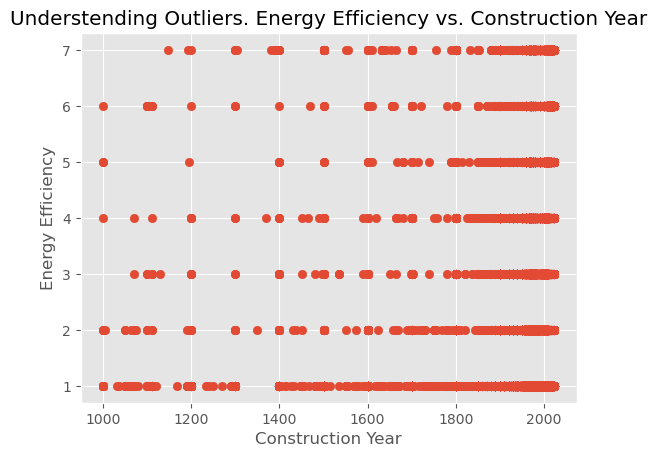

In [65]:
# Create a scatter plot
plt.scatter(intrum['construction_year'], intrum['energy_efficiency_num'])

# Add labels and title
plt.xlabel('Construction Year')
plt.ylabel('Energy Efficiency')
plt.title('Understending Outliers. Energy Efficiency vs. Construction Year')

# Display the plot
plt.show()

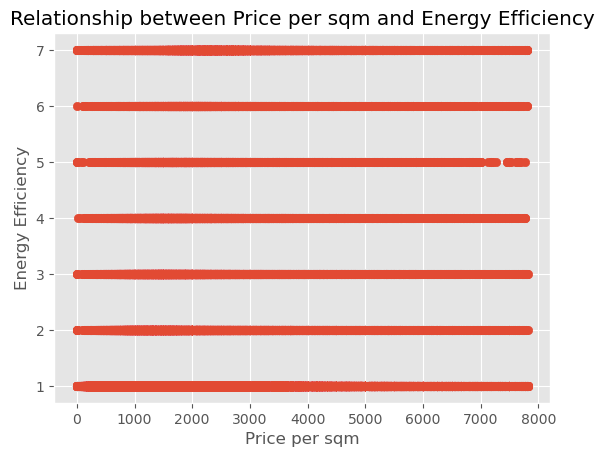

In [66]:
plt.scatter(intrum['price_per_m2'], intrum['energy_efficiency_num'])
plt.xlabel('Price per sqm')
plt.ylabel('Energy Efficiency')
plt.title('Relationship between Price per sqm and Energy Efficiency')
plt.show()

In [67]:
# Calculate correlation
correlation = intrum['energy_efficiency_num'].corr(intrum['price_per_m2'])

print("Correlation coefficient:", correlation)

Correlation coefficient: 0.1610095206797977


In [68]:
# Calculate correlation
correlation = intrum['energy_efficiency_num'].corr(intrum['price'])

print("Correlation coefficient:", correlation)

Correlation coefficient: 0.09102273838214772


In [69]:
fig = px.scatter_mapbox(intrum, lat='latitude', lon='longitude', zoom=5, width=800, height=600, color='energy_efficiency_num', color_continuous_scale='spectral')
fig.update_layout(mapbox_style='open-street-map')
fig.update_traces(marker=dict(size=2))

# display the map
fig.show()